# Wang 2022 - Normalization
<div class="alert alert-warning">

**What this notebook does**

Data should be normalized in order to compare cells because counts are affected by sequencing depth, gene length and cell cycle phase.
<br>

In this notebook the different sample count tables of Wang et. al. are normalized. The data used has already been filtered.

<br>
Standard:
Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells. Then these normalized values are log-normalized to lower the significance of outliers.
<br>

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import anndata as ad
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#filtered doublets
path='/home/hers_basak/jjiang/jack/outputs/deliverables/2_filtering/data/filtered_'
suffix='base_S'
atlas='wang'

S06=f'{path}{atlas}_{suffix}06.h5ad'
S07=f'{path}{atlas}_{suffix}07.h5ad'
S09=f'{path}{atlas}_{suffix}09.h5ad'
S11=f'{path}{atlas}_{suffix}11.h5ad'
S16=f'{path}{atlas}_{suffix}16.h5ad'
S22=f'{path}{atlas}_{suffix}22.h5ad'
S23=f'{path}{atlas}_{suffix}23.h5ad'
S24=f'{path}{atlas}_{suffix}24.h5ad'
S33=f'{path}{atlas}_{suffix}33.h5ad'
S36=f'{path}{atlas}_{suffix}36.h5ad'

In [4]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization')

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/3_normalization'

In [13]:
!ls data

processed_agarwal_base_GSM4157068.h5ad
processed_agarwal_base_GSM4157069.h5ad
processed_agarwal_base_GSM4157070.h5ad
processed_agarwal_base_GSM4157072.h5ad
processed_agarwal_base_GSM4157074.h5ad
processed_agarwal_base_GSM4157076.h5ad
processed_agarwal_base_GSM4157078.h5ad
processed_altena_base_g004.h5ad
processed_altena_base_g005.h5ad
processed_altena_base_g011.h5ad
processed_altena_base_g012.h5ad
processed_altena_base_g013.h5ad
processed_altena_base_g014.h5ad
processed_altena_base_g015.h5ad
processed_altena_base_g016.h5ad
processed_altena_base_g017.h5ad
processed_altena_base_g018.h5ad
processed_altena_base_g019.h5ad
processed_altena_base_g020.h5ad
processed_siletti_base_S173_3.h5ad
processed_siletti_base_S173_4.h5ad
processed_siletti_base_S173_5.h5ad
processed_siletti_base_S175_7.h5ad
processed_siletti_base_S175_8.h5ad
processed_siletti_base_S176_1.h5ad
processed_siletti_base_S176_2.h5ad
processed_siletti_base_S193_1.h5ad
processed_siletti_base_S193_2.h5ad
processed_siletti_base_S194_

In [14]:
files = [S06,S07,S09,S11,S16,S22,S23,S24,S33,S36]

In [15]:
names = ['S06','S07','S09','S11','S16','S22','S23','S24','S33','S36']

In [16]:
object_names_filtered=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_filtered.append("adata"+"_"+names[i]+"_"+"filtered_1")
    locals()[object_names_filtered[i]] = sc.read(files[i]) 
    print(object_names_filtered[i],' is loaded')

adata_S06_filtered_1  is loaded
adata_S07_filtered_1  is loaded
adata_S09_filtered_1  is loaded
adata_S11_filtered_1  is loaded
adata_S16_filtered_1  is loaded
adata_S22_filtered_1  is loaded
adata_S23_filtered_1  is loaded
adata_S24_filtered_1  is loaded
adata_S33_filtered_1  is loaded
adata_S36_filtered_1  is loaded


In [17]:
for i in range(numberobj):
    print(names[i])
    print(locals()[object_names_filtered[i]])

S06
AnnData object with n_obs × n_vars = 9826 × 30429
    obs: 'species', 'gender', 'age', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'
S07
AnnData object with n_obs × n_vars = 8783 × 28740
    obs: 'species', 'gender', 'age', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito'
  

## Normalization

In [18]:
## Normalize and Logarithmize
for i in range(numberobj):
    locals()[object_names_filtered[i]].raw = locals()[object_names_filtered[i]].copy()
    sc.pp.normalize_total(locals()[object_names_filtered[i]], key_added='total_counts_norm',target_sum=10000)
    sc.pp.log1p(locals()[object_names_filtered[i]])
    print(object_names_filtered[i], ' has been normalized and logarithmized')

adata_S06_filtered_1  has been normalized and logarithmized
adata_S07_filtered_1  has been normalized and logarithmized
adata_S09_filtered_1  has been normalized and logarithmized
adata_S11_filtered_1  has been normalized and logarithmized
adata_S16_filtered_1  has been normalized and logarithmized
adata_S22_filtered_1  has been normalized and logarithmized
adata_S23_filtered_1  has been normalized and logarithmized
adata_S24_filtered_1  has been normalized and logarithmized
adata_S33_filtered_1  has been normalized and logarithmized
adata_S36_filtered_1  has been normalized and logarithmized


### Identify highly-variable genes
This step is important to choose the feature that will be used for dimensionality reduction ()

In [19]:
for i in range(numberobj): 
    sc.pp.highly_variable_genes(locals()[object_names_filtered[i]], min_mean=0.0125, max_mean=3, min_disp=0.5,flavor='seurat') #seurat_v3 is giving an error
    print('worked')

worked
worked
worked
worked
worked
worked
worked
worked
worked
worked


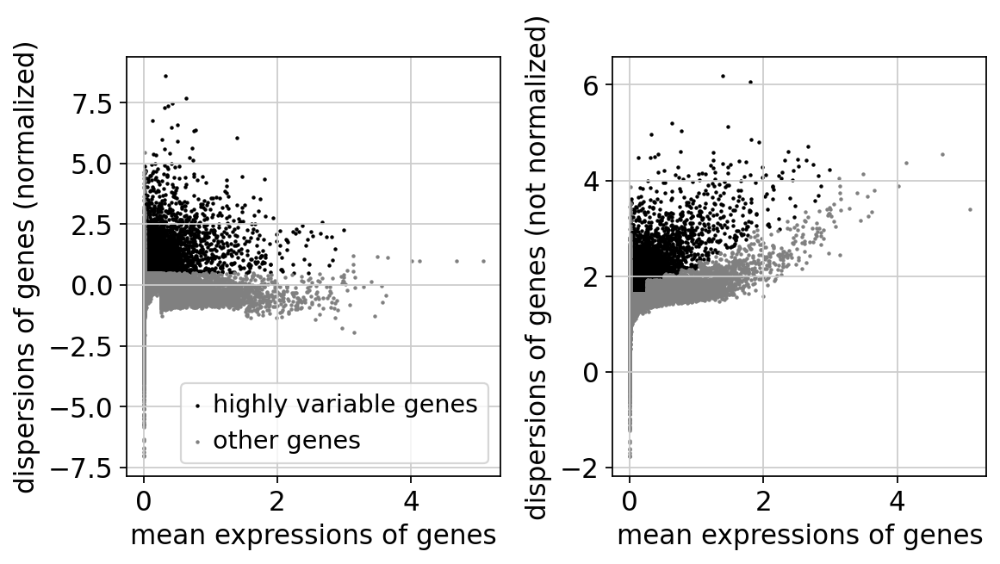

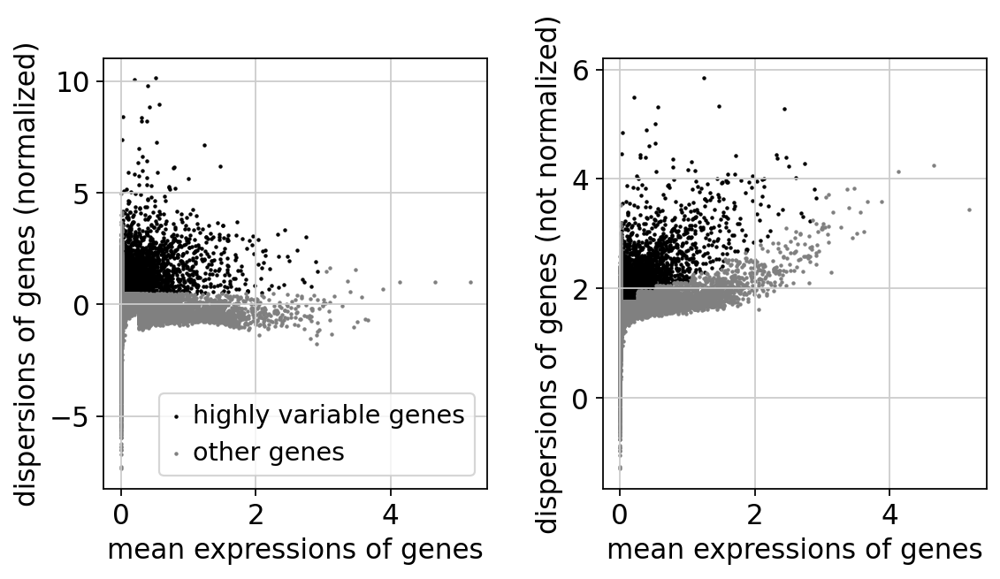

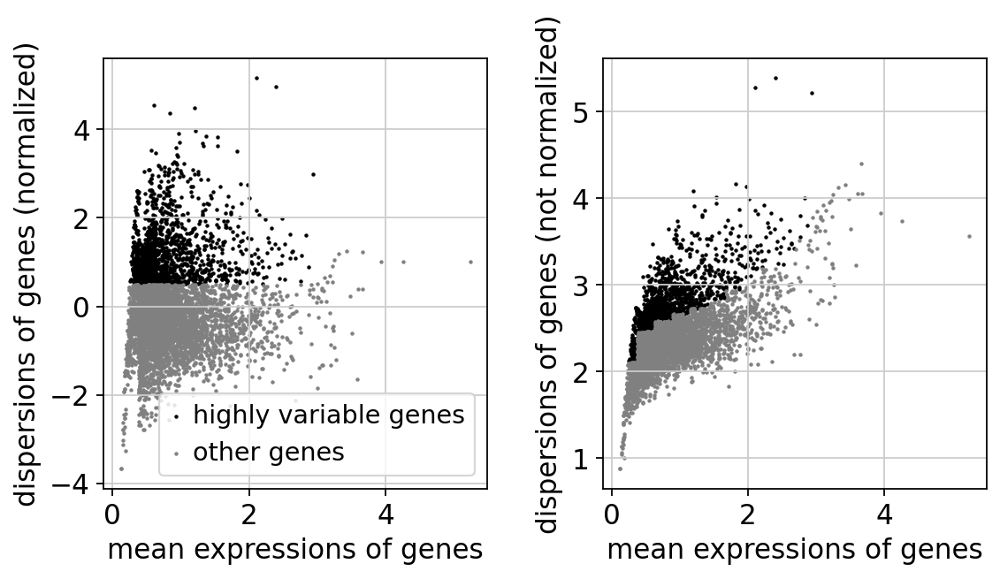

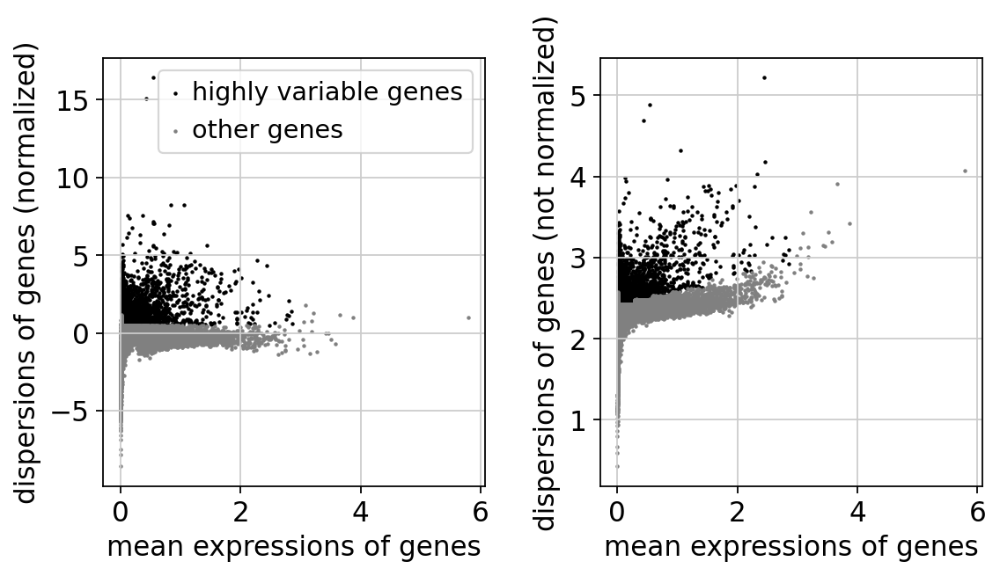

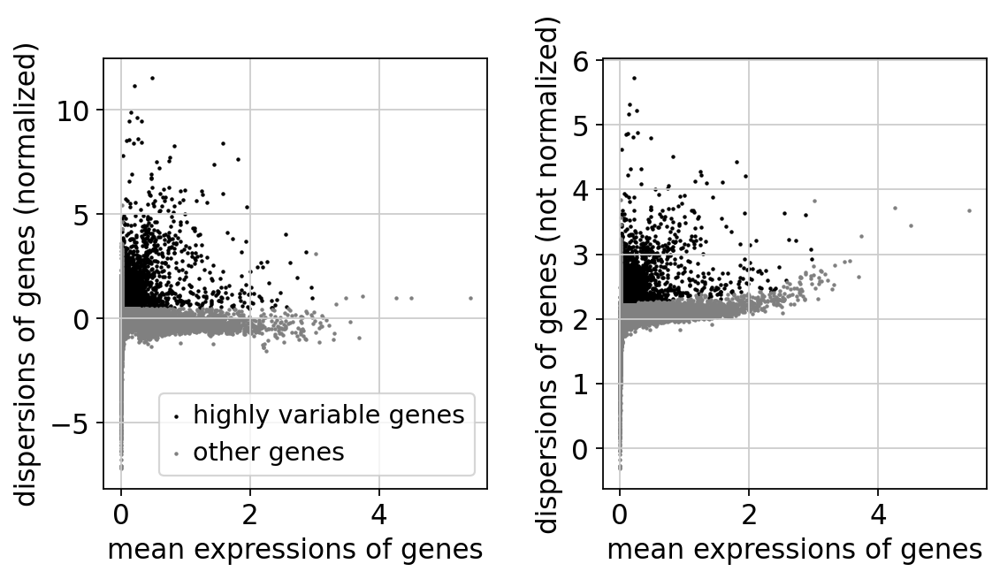

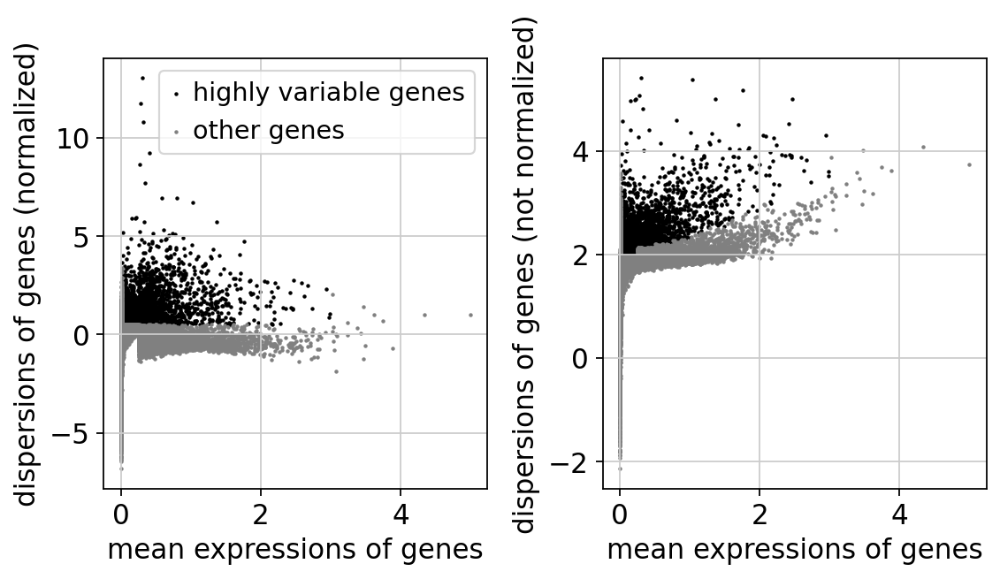

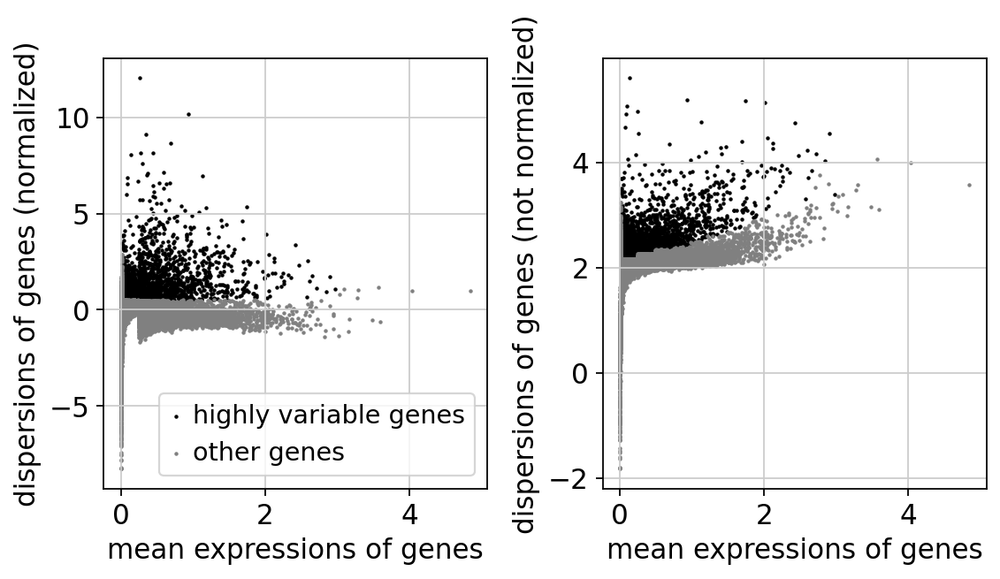

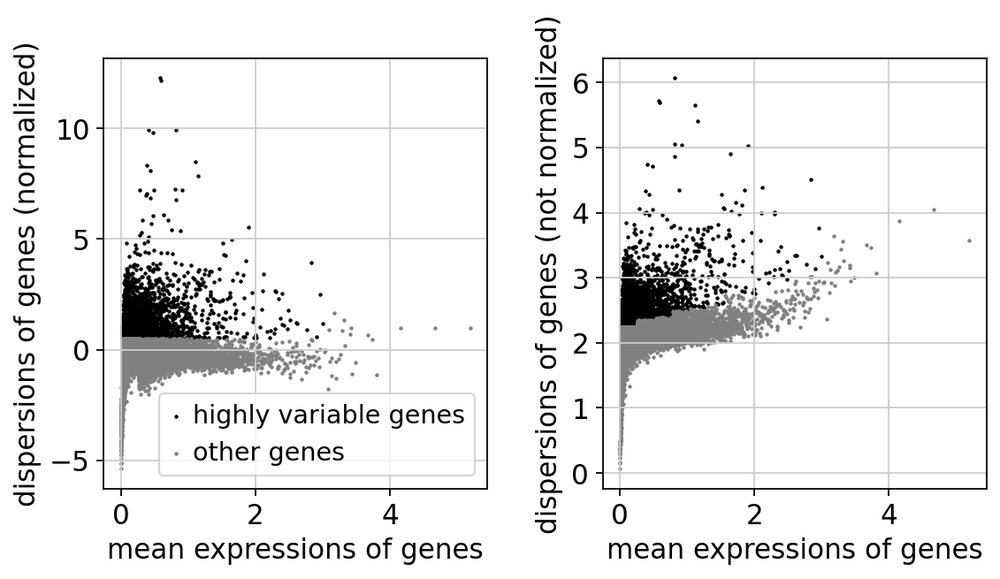

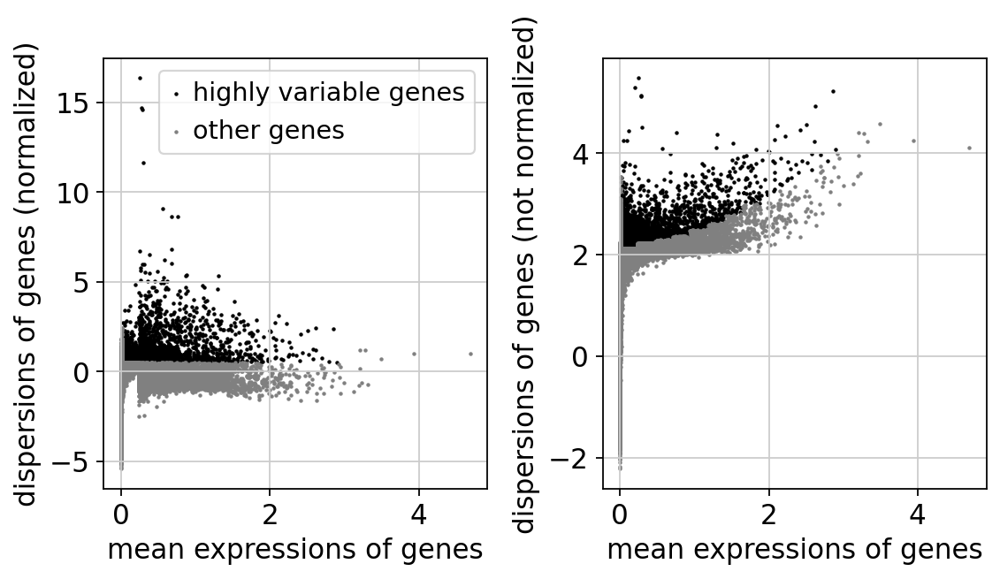

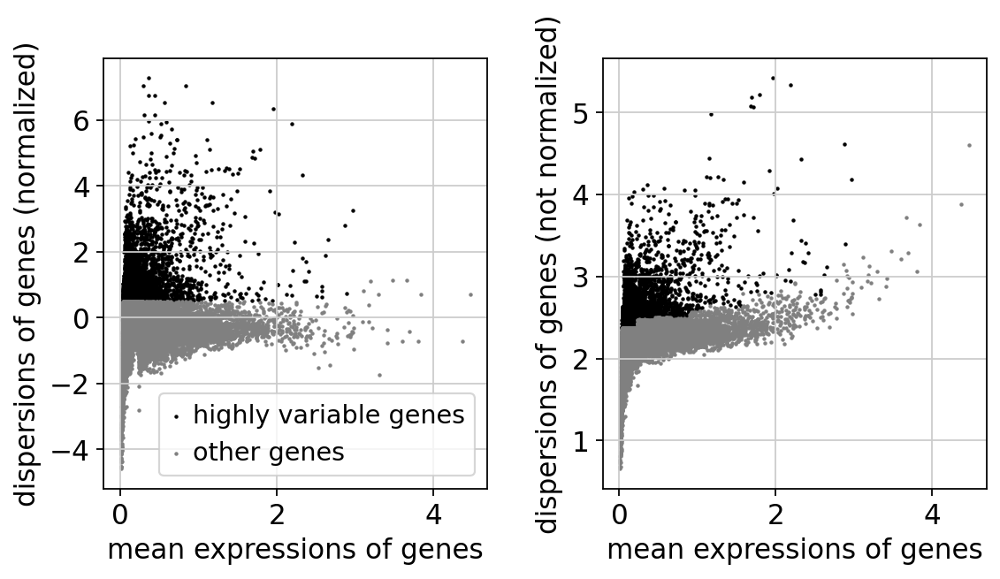

In [20]:
for i in range(numberobj): 
    sc.pl.highly_variable_genes(locals()[object_names_filtered[i]])

### regress and scale
We will compare data regressed for the number of counts and scaled to unprocessed data. It is better to do the least possible. This also saves from memory and disk space. Still, if the number of counts influence the embedding, we need to correct for this \
Note: You could skip filtering for highly variable genes only if you dont need to regress and scale
https://github.com/theislab/single-cell-tutorial/issues/35

In [21]:
for i in range(numberobj):
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]].copy()
    locals()[object_names_filtered[i]+"_reg"].raw = locals()[object_names_filtered[i]+"_reg"]
    locals()[object_names_filtered[i]+"_reg"] = locals()[object_names_filtered[i]+"_reg"][:, locals()[object_names_filtered[i]+"_reg"].var['highly_variable']]
    sc.pp.regress_out(locals()[object_names_filtered[i]+"_reg"], ['total_counts']) # previously, we regreesed 'n_counts_filtered','percent_mito'
    sc.pp.scale(locals()[object_names_filtered[i]+"_reg"], max_value=10)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [22]:
object_names_reg = list()
numberobj = len(files)
for i in range(numberobj):
    object_names_reg.append(object_names_filtered[i]+"_reg")

In [23]:
object_names_reg

['adata_S06_filtered_1_reg',
 'adata_S07_filtered_1_reg',
 'adata_S09_filtered_1_reg',
 'adata_S11_filtered_1_reg',
 'adata_S16_filtered_1_reg',
 'adata_S22_filtered_1_reg',
 'adata_S23_filtered_1_reg',
 'adata_S24_filtered_1_reg',
 'adata_S33_filtered_1_reg',
 'adata_S36_filtered_1_reg']

# Dimensional Reduction

In [24]:
#To make reproducible plots
np.random.seed(41)

### Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [25]:
for i in range(numberobj):
    sc.tl.pca(locals()[object_names_filtered[i]], svd_solver='arpack')
    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

S06


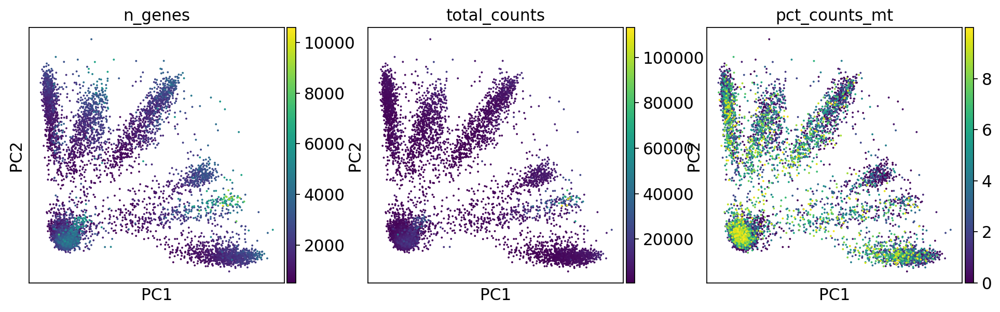

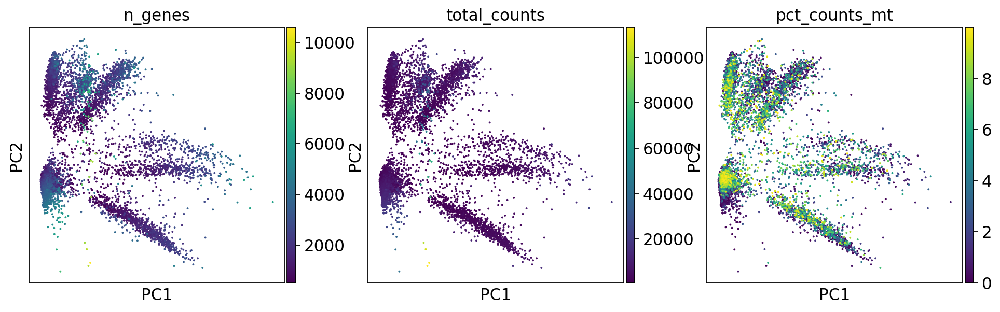

S07


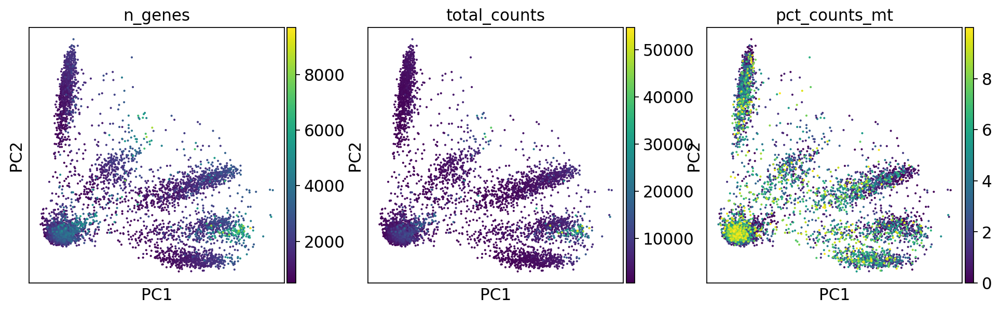

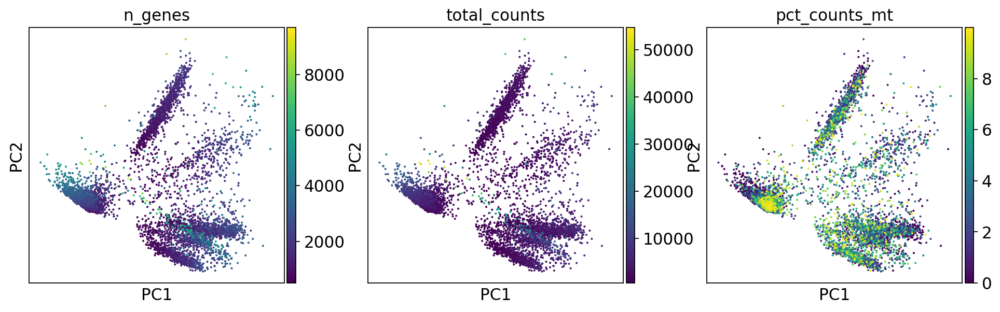

S09


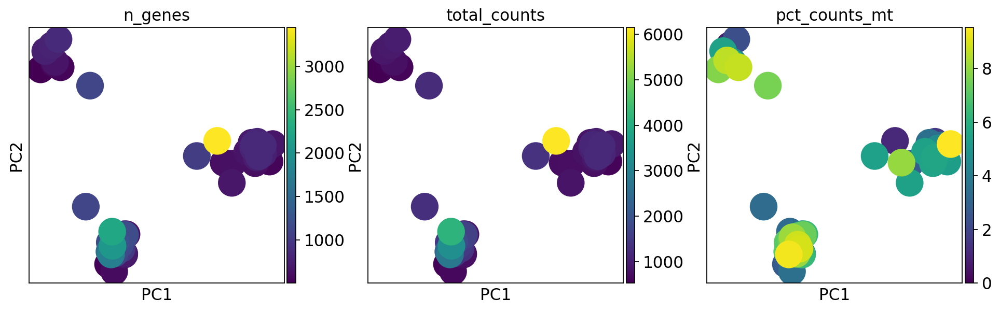

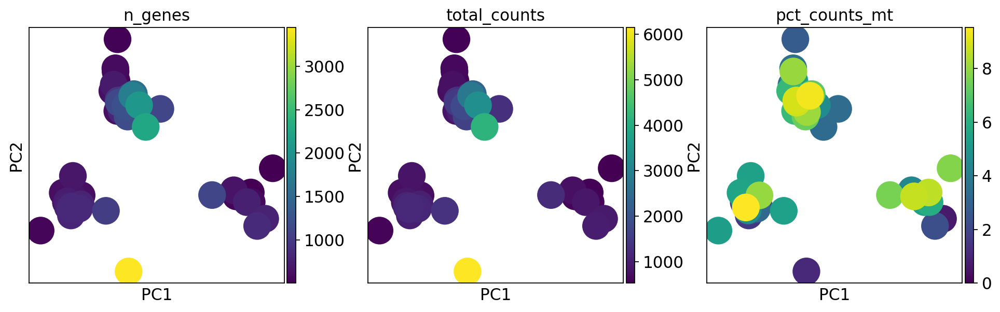

S11


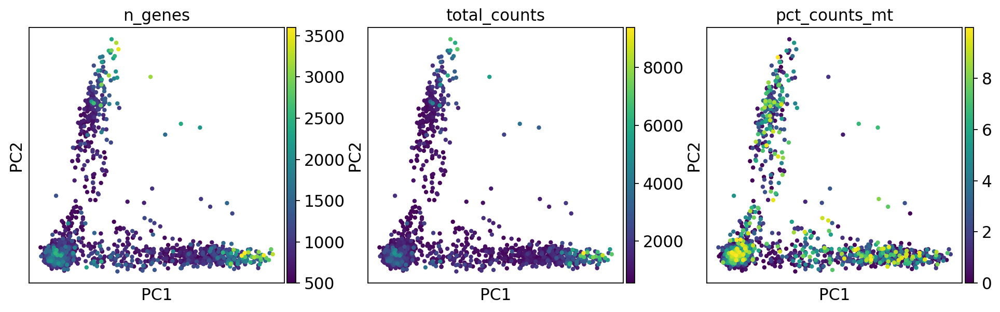

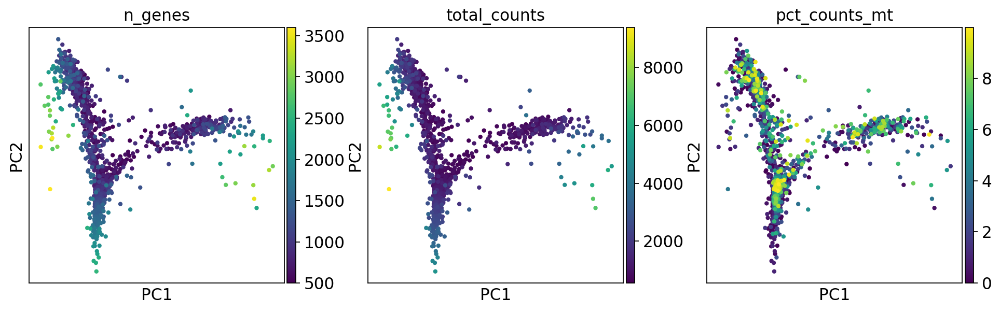

S16


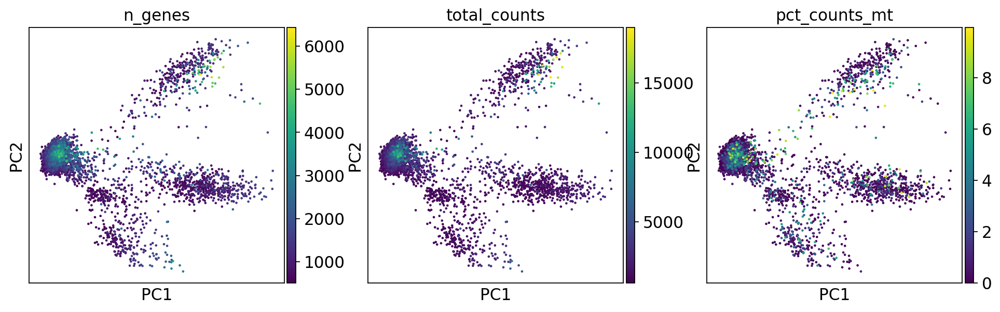

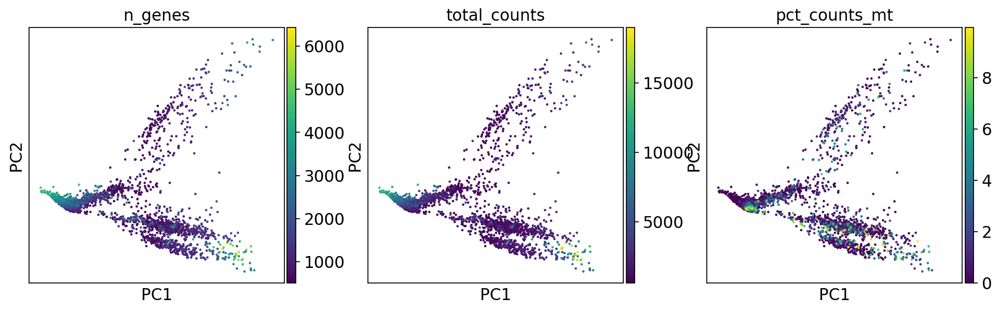

S22


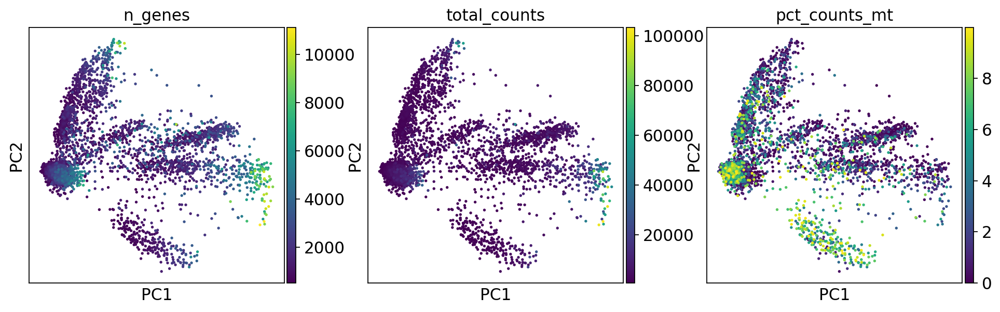

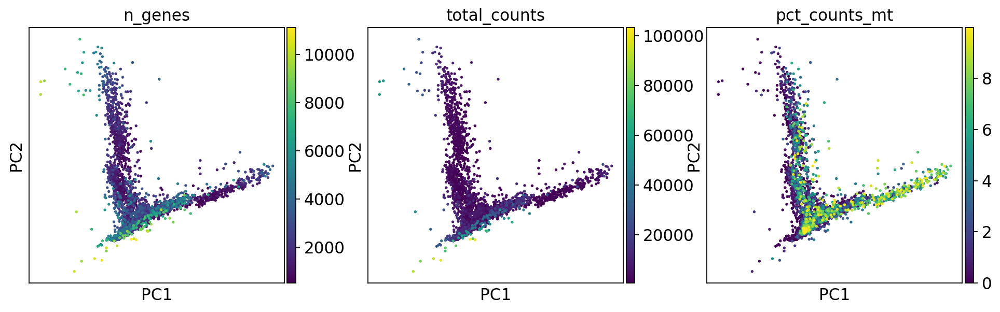

S23


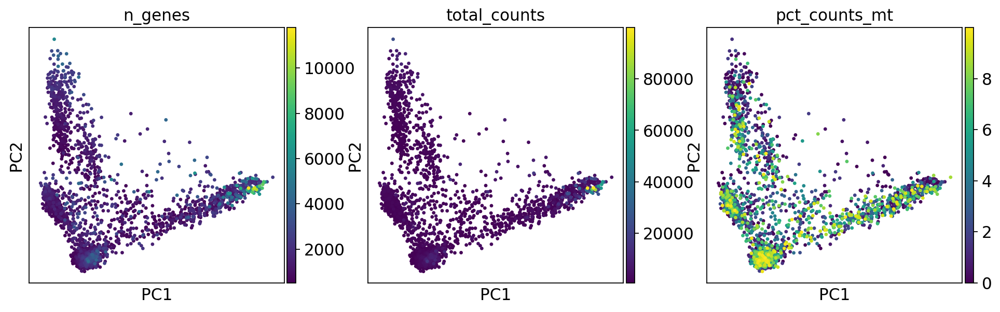

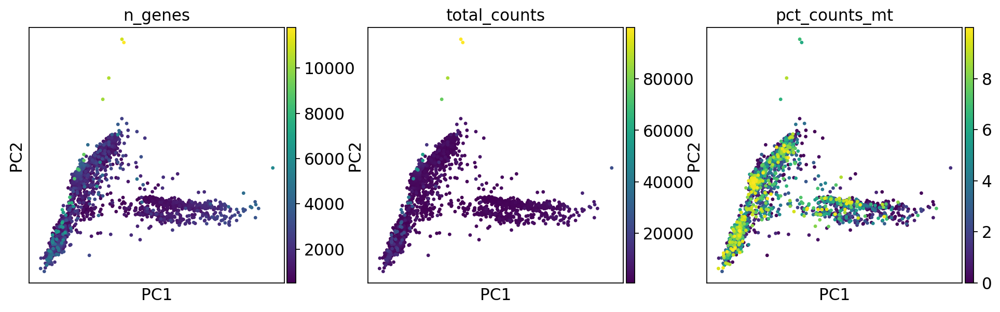

S24


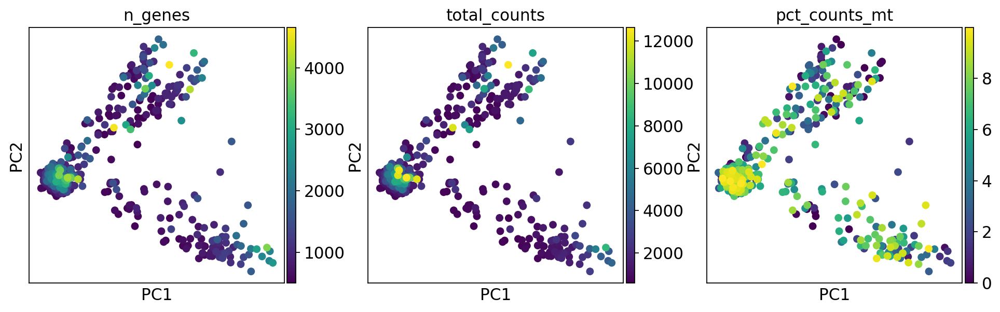

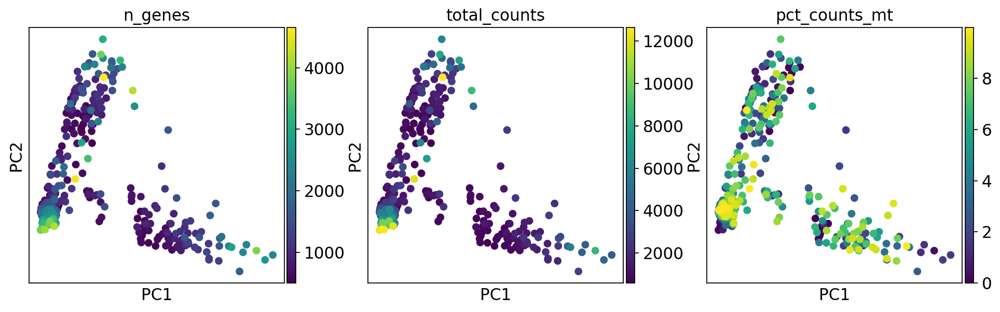

S33


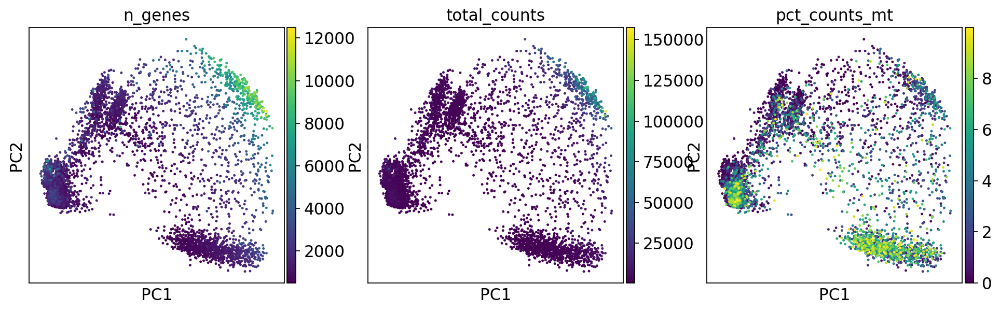

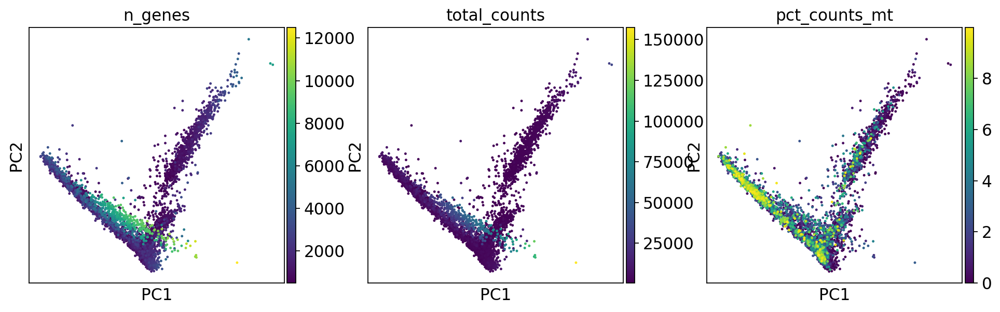

S36


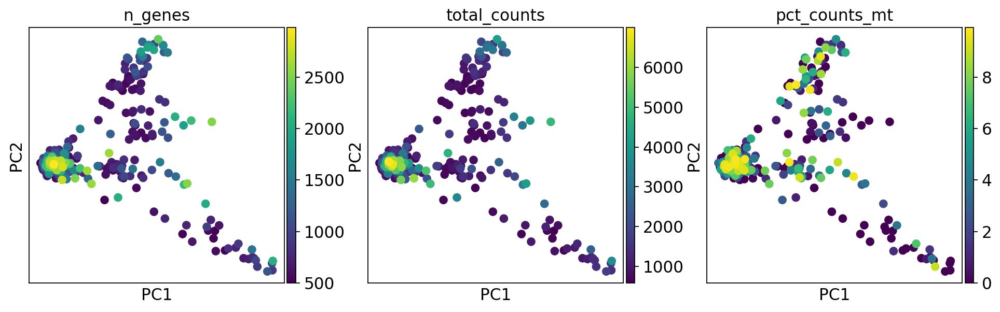

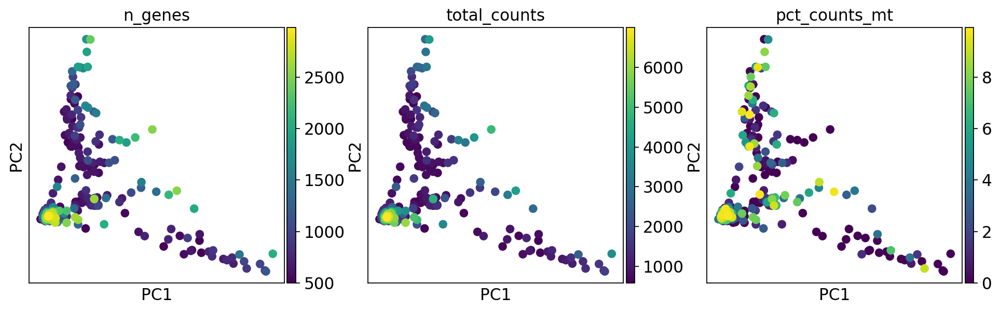

In [26]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'])#, save = "_"+object_names_filtered[i]+"_pca.pdf")
    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'])#, save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


**Visualizing cells with marker genes:**<br>
Gfap: Astrocytes <br>
Plp1: myelin proteolipid protein, oligodendritic glial sheaths<br>
Rbfox3: post-mitotic neurons<br>
Gad1: GABAergic neuronal marker (extrasynaptic and metabolic purposes)<br>
Gad2: GABAergic neuronal marker (regulate vesicular pool for release)<br>
Slc17a6: glutamatergic neurons (with Th colocalize VTA)<br>
Th: Dopaminergic neurons<br>
Pecam1: Endothelial cells<br>
P2ry12: Microglia<br>

S06


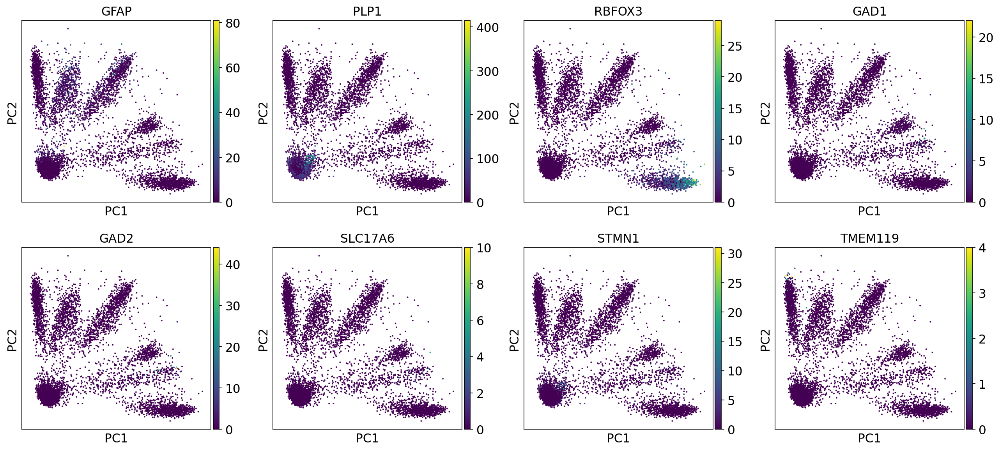

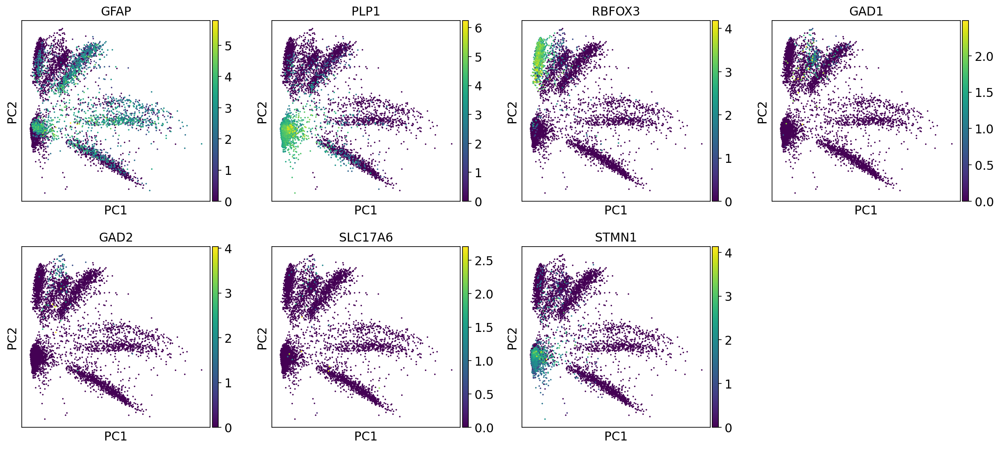

S07


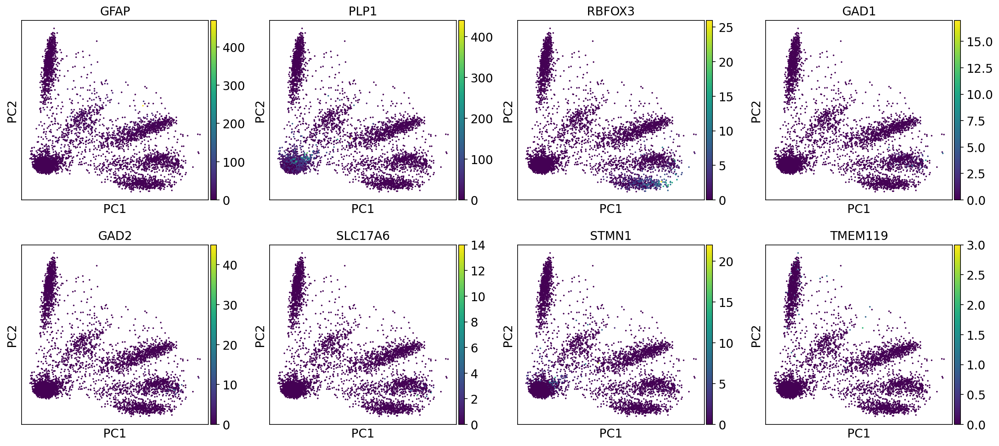

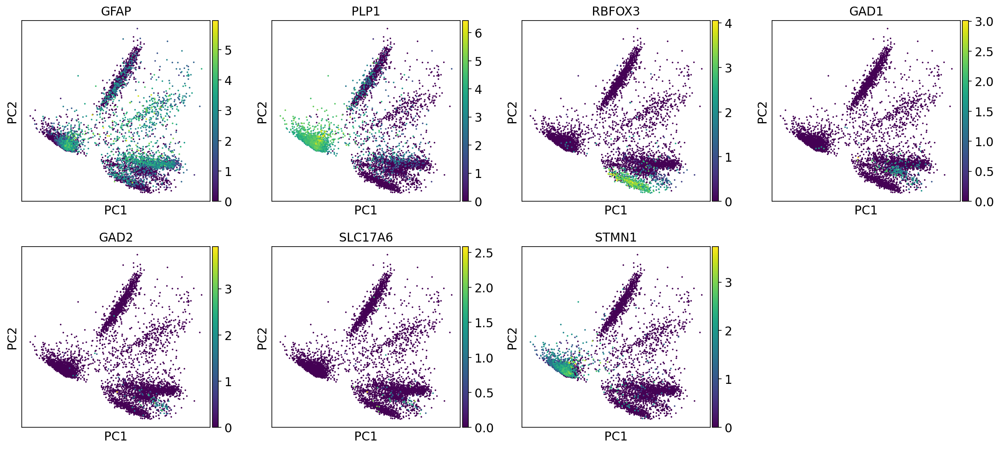

S09


KeyError: 'GFAP'

<Figure size 1545.6x640 with 0 Axes>

In [27]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1','TMEM119'])
                  #,save = "_"+object_names_filtered[i]+"_pca_markers.pdf") # title =object_names[i],
        sc.pl.pca(locals()[object_names_reg[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','STMN1'])
        #,save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names[i],
    elif locals()[object_names_filtered[i]].obs['species'][0] == 'Mus musculus':
        sc.pl.pca(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ])
        #,save = "_"+object_names_filtered[i]+"_pca_markers.pdf") #title =object_names_reg[i], 
#        sc.pl.pca(locals()[object_names_reg[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], 
#                save = "_"+object_names_reg[i]+"_metrics_2.pdf") #title =object_names_reg[i], 


Seems like taking only highly variable genes tends to cluster everything together -> maybe due to outliers

### UMAP

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. \
We will run the following for quick analyses. Later, we will use some metrics to fing out the best dimensionality reduction parameters for UMAP and t-SNE. This is best done on merged datasets

In [ ]:
 for i in range(numberobj):
    nn = int(np.sqrt(len(locals()[object_names_filtered[i]])/2))
    print(nn)

In [ ]:
nn= 15 #default 15
for i in range(numberobj):
    try :
        sc.pp.neighbors(locals()[object_names_filtered[i]], n_neighbors=nn, n_pcs=40)
        sc.pp.neighbors(locals()[object_names_reg[i]], n_neighbors=nn, n_pcs=40)
    except:
        sc.pp.neighbors(locals()[object_names_filtered[i]], n_neighbors=nn, n_pcs=20)
        sc.pp.neighbors(locals()[object_names_reg[i]], n_neighbors=nn, n_pcs=20)
    sc.tl.umap(locals()[object_names_filtered[i]])
    sc.tl.umap(locals()[object_names_reg[i]])

In [ ]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_filtered[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=False, s=25)
           #,save = "_"+object_names_filtered[i]+"_umap_n"+str(nn)+".pdf")
    sc.pl.umap(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt','pct_counts_ribo'], use_raw=False, s=25)
         #,save = "_"+object_names_reg[i]+"_umap_n"+str(nn)+".pdf")

### Plot with marker genes

In [ ]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_filtered[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_filtered[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=False, s=25)
                  #,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")
        sc.pl.umap(locals()[object_names_reg[i]], color=['GFAP', 'PLP1','GAD2', 'TH'], use_raw=False, s=25) #filters out 'RBFOX3','GAD1','SLC17A6'
    else:
        sc.pl.umap(locals()[object_names_filtered[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'], use_raw=True, s=25)
                  #,save = "_"+object_names_filtered[i]+"_umap_markers_n"+str(nn)+".pdf")

### Save
nn =15

In [55]:
print(object_names_filtered[i][6:].split('_filtered')[0])

S06


In [56]:
for i in range(numberobj):
    locals()[object_names_filtered[i]].write(os.path.join('./data/processed_wang_base_'+object_names_filtered[i][6:].split('_filtered')[0])+'.h5ad')
    locals()[object_names_reg[i]].write(os.path.join('./data/processed_wang_base_'+object_names_reg[i][6:].split('_filtered')[0])+'_reg.h5ad')

In [57]:
!ls data/

processed_agarwal_base_GSM4157068.h5ad
processed_agarwal_base_GSM4157068_reg.h5ad
processed_agarwal_base_GSM4157069.h5ad
processed_agarwal_base_GSM4157069_reg.h5ad
processed_agarwal_base_GSM4157070.h5ad
processed_agarwal_base_GSM4157070_reg.h5ad
processed_agarwal_base_GSM4157072.h5ad
processed_agarwal_base_GSM4157072_reg.h5ad
processed_agarwal_base_GSM4157074.h5ad
processed_agarwal_base_GSM4157074_reg.h5ad
processed_agarwal_base_GSM4157076.h5ad
processed_agarwal_base_GSM4157076_reg.h5ad
processed_agarwal_base_GSM4157078.h5ad
processed_agarwal_base_GSM4157078_reg.h5ad
processed_altena_base_g004.h5ad
processed_altena_base_g004_reg.h5ad
processed_altena_base_g005.h5ad
processed_altena_base_g005_reg.h5ad
processed_altena_base_g011.h5ad
processed_altena_base_g011_reg.h5ad
processed_altena_base_g012.h5ad
processed_altena_base_g012_reg.h5ad
processed_altena_base_g013.h5ad
processed_altena_base_g013_reg.h5ad
processed_altena_base_g014.h5ad
processed_altena_base_g014_reg.h5ad
processed_altena_b